# **IPM model to estimate IPM from a single image.**
Based on Pix2Pix Architectire


In [1]:
!nvidia-smi

Sun Jun  4 09:39:33 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 522.06       Driver Version: 522.06       CUDA Version: 11.8     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ... WDDM  | 00000000:01:00.0 Off |                  N/A |
| N/A   54C    P5     4W /  N/A |    180MiB /  4096MiB |     15%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
import tensorflow as tf
import json

print("TensorFlow version:", tf.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

TensorFlow version: 2.10.1
Num GPUs Available:  1


# 1) Data preprocessing

## Partition of the image directions

From 1495 images, 1196 are for training and 299 for testing



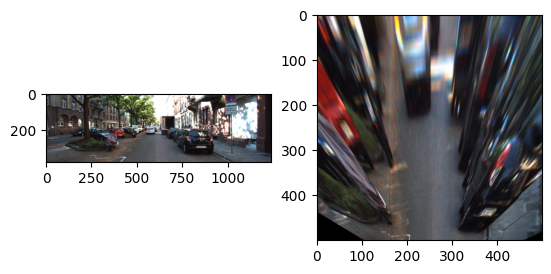


The input image is of size (375, 1242, 3) and target image of size (500, 500, 3).


In [3]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import os

SEED= 5 # To get always the same dataset among different executions obtaining consistency for the results
DataTreatment=0 # Put to 1 in case it is willing to generate a new dataset, otherwise it must be 0 to just load an already created dataset

# Root paths
ROOT_PATH = r"C:\Users\Alejandro\Documents\Universitat\Master MUAR\Q2\Reconeixement de Formes i Aprenentatge Automàtic\Treball final\DepthGAN"

#Input paths with all possible images to use on a training procedure.
IN_DIR = ROOT_PATH + '/all_input/'

# Output data folder
OUT_DIR = ROOT_PATH + '/all_target/'

# Output plot paths
global PLT_PATH
PLT_PATH = r"C:\Users\Alejandro\Documents\Universitat\Master MUAR\Q2\Reconeixement de Formes i Aprenentatge Automàtic\Treball final\DepthGAN\Plots"

# Checkpoint paths
CK_PATH = ROOT_PATH + '/checkpoints'

# Path to dataset already augmented
TRAIN_DIR=ROOT_PATH + '/train_data'
TEST_DIR=ROOT_PATH + '/test_data'

# Complete paths for all folders
PATH = os.path.abspath(ROOT_PATH)
INPATH = os.path.join(PATH, IN_DIR)
OUTPATH = os.path.join(PATH, OUT_DIR)
PLT_PATH = os.path.join(PATH, PLT_PATH)
CKPATH = os.path.join(PATH, CK_PATH)
TRAINPATH= os.path.join(PATH, TRAIN_DIR)
TESTPATH= os.path.join(PATH, TEST_DIR)

# Store the name of all input images
imgurls = os.listdir(INPATH)

#Randomize data order as it is ordered by timestamp
n = len(imgurls) # Number of dataset images
train_n = round(n * 0.8) # Amount of samples to use for training 

# Pseudo - randomized samples (to have possibility between calls to get the program with same dataset images values) 
np.random.seed(SEED)
randurls = np.copy(imgurls)
np.random.shuffle(randurls)

# Split into train and test
tr_urls = randurls[:train_n] # Training images
ts_urls = randurls[train_n:n] # Testing images

print('From {} images, {} are for training and {} for testing\n'.format(len(imgurls), len(tr_urls), len(ts_urls)))

in_im = plt.imread(INPATH + randurls[0])
tg_im = plt.imread(OUTPATH + randurls[0])

fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(in_im)
ax2.imshow(tg_im)
plt.show()

print('\nThe input image is of size {} and target image of size {}.'.format(in_im.shape, tg_im.shape))

## Load images and preprocessing

1.   Define resize function
2.   Define normalization function
3.   Augmentation with random Jitter




The input image is of size (128, 128, 3) and target image of size (128, 128, 3).


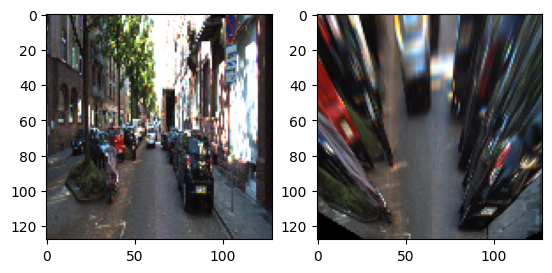


The input image is of size (128, 128, 3) and target image of size (128, 128, 3).


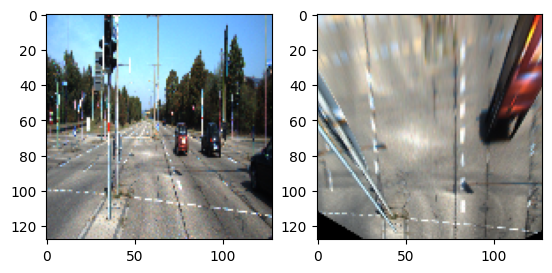

In [4]:
IMG_WIDTH = 128
IMG_HEIGHT = 128

# Image reescaling
def resize(inimg, tgimg, height=IMG_WIDTH, width=IMG_HEIGHT):

  inimg = tf.image.resize(inimg, [height, width])
  tgimg = tf.image.resize(tgimg, [height, width])

  return inimg, tgimg

# Work on the domain from 0 a 1
def normalize(inimg, tgimg):

  inimg = (inimg / 127.5) - 1
  tgimg = (tgimg / 127.5) - 1

  return inimg, tgimg

@tf.function()
def random_jitter(inimg, tgimg):

  # Start resizing both images to 128x128 pixels
  inimg, tgimg = resize(inimg, tgimg)
  
  # Stack both images
  stacked_image = tf.stack([inimg, tgimg], axis=0)
  
  # Crop the image from 286 to 256 with a random crop
  cropped_image = tf.image.random_crop(stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])
  
  # Recover the original images and unstack that.
  inimg, tgimg = cropped_image[0] , cropped_image[1]

  if tf.random.uniform(()) > 0.5:
    inimg = tf.image.flip_left_right(inimg)
    tgimg = tf.image.flip_left_right(tgimg)
  
  return inimg, tgimg

# Load all the images 
def load_image(filename, augment=True):

  # Load all images and specify that we only want the RGB channels to avoid problems with PNG images. 
  inimg = tf.cast(tf.image.decode_jpeg(tf.io.read_file(INPATH + '/' + filename)), tf.float32)[...,:3]
  tgimg = tf.cast(tf.image.decode_jpeg(tf.io.read_file(OUTPATH + '/' + filename)), tf.float32)[...,:3]

  # Make the resize, but not sure if it must be done since the random jitter already does it.
  inimg, tgimg = resize(inimg, tgimg, IMG_HEIGHT, IMG_WIDTH)

  if (augment==True):
    inimg, tgimg = random_jitter(inimg, tgimg)
  
  inimg, tgimg = normalize(inimg, tgimg)   
    
  return inimg, tgimg

def load_train_image(filename):
  return load_image(filename, True)

def load_test_image(filename):
  return load_image(filename, False)

##### SANITY CHECK TO SEE IF ALL IS OKAY #####
inimg, tgimg = load_train_image(tr_urls[0])
print('\nThe input image is of size {} and target image of size {}.'.format(inimg.shape, tgimg.shape))
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow((inimg + 1 ) / 2)
ax2.imshow((tgimg + 1 ) / 2)
plt.show()

##### SANITY CHECK TO SEE IF ALL IS OKAY #####
inimg, tgimg = load_test_image(ts_urls[0])
print('\nThe input image is of size {} and target image of size {}.'.format(inimg.shape, tgimg.shape))
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow((inimg + 1 ) / 2)
ax2.imshow((tgimg + 1 ) / 2)
plt.show()

## Load images on dataset after preprocessing them:

Important to put the DataTreatment value to 1 or 0 depending on the purpose with the datasets: 

- If it is willing to create a new dataset: DataTreatment must be 1
- If it is willing to just load an already created dataset: DataTreatment must be 0

(2, 128, 128, 3)


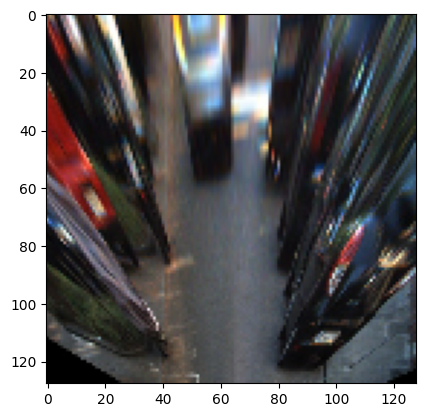

(2, 128, 128, 3)


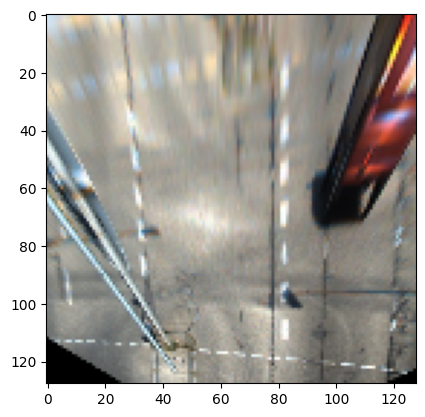

In [5]:
# Get the new datasets if it has not been generated yet.
if (DataTreatment == 1):  
  # Generate a dataset with a set of elements that must be specified.
  train_dataset = tf.data.Dataset.from_tensor_slices(tr_urls)
  # Map the dataset generated with the function that we want to upload all images.
  train_dataset = train_dataset.map(load_train_image, num_parallel_calls = tf.data.experimental.AUTOTUNE)

  # Same operations with testing dataset
  # Generate a dataset with a list of the elements as explained on this. 
  test_dataset = tf.data.Dataset.from_tensor_slices(ts_urls)
  # Map the dataset obtained with the function we want to upload all images.
  test_dataset = test_dataset.map(load_test_image, num_parallel_calls = tf.data.experimental.AUTOTUNE)

  # Save all dataset on the file directory specified 
  train_dataset.save(TRAINPATH+'/Training_dataset')
  test_dataset.save(TESTPATH+'/Testing_dataset')
  
# Load all datasets if they have been generated before
else:
  batch = 2 # Define the batch size for the datasets
  train_dataset=tf.data.Dataset.load(TRAINPATH+'/Training_dataset')
  test_dataset=tf.data.Dataset.load(TESTPATH+'/Testing_dataset')
  
  # Distribute the data in different batches.
  train_dataset = train_dataset.batch(batch)
  test_dataset = test_dataset.batch(batch)
  
##### SANITY CHECK TO SEE IF ALL IS OKAY #####
for in_img, tg_img in train_dataset.take(1):
  print(tg_img.shape)
  plt.imshow(((tg_img[0,...]) + 1 ) / 2)
  plt.show()
  
for in_img, tg_img in test_dataset.take(1):
  print(tg_img.shape)
  plt.imshow(((tg_img[0,...]) + 1 ) / 2)
  plt.show()

# 2) Pix2Pix architecture

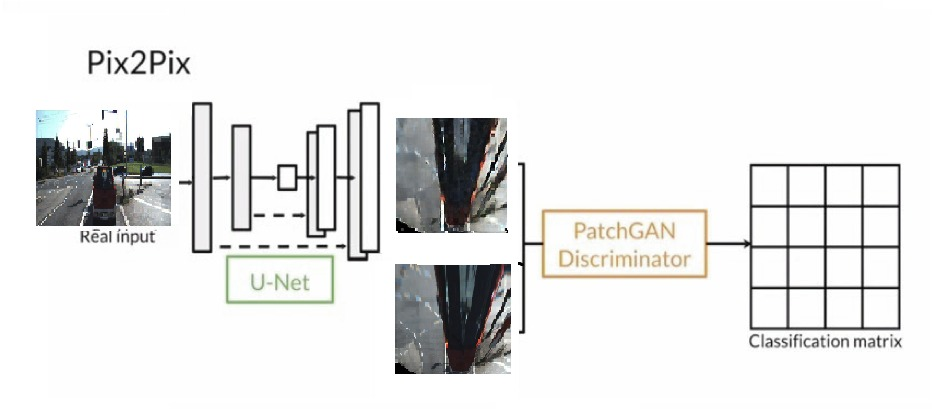

In [6]:
#Library to ✨visualize✨ the nets lately
!pip install visualkeras
import visualkeras

### Generate the Neural Network models for both generator and discriminator: 

### - Generator: Based on an encoder-decoder architecture (Unet).
### - Discriminator: Based on a convolutional neural network without the final layer.
### - Creation of the adversarial loss function.

#### Generator encoder part (Unet Downsample):

In [7]:
from tensorflow.keras import *
from tensorflow.keras.layers import *

# NUMBER OF OUTPUT LAYER IMAGE CHANNELS. 
# If we want the output layer to only have 1 color channel n=1, if generated image is rgb n=3
chnl_num = 3

# Encoder
def downsample(filters, apply_batchnorm=True):

  result = Sequential()

  initializer = tf.random_normal_initializer(0, 0.02)

  # Convolutional layer
  result.add(Conv2D(filters,
             kernel_size = 4,
             strides = 2,
             padding = 'same', 
             kernel_initializer=initializer,
             use_bias = not apply_batchnorm))

  if apply_batchnorm:
    # Batch normalization layer
    result.add(BatchNormalization())

  # Activation function layer
  result.add(LeakyReLU())

  return result

##### SANITY CHECK TO SEE IF ALL IS OKAY #####
down_model = downsample(3)
down_result = down_model(tf.expand_dims(inimg, 0))
print (down_result.shape)

(1, 64, 64, 3)


#### Generator Decoder part (Unet Upsampler):

In [8]:
from tensorflow.python.ops.gen_nn_ops import Conv2DBackpropFilter

# Decoder
def upsample(filters, apply_dropout=True):

  result = Sequential()

  initializer = tf.random_normal_initializer(0, 0.02)

  # Convolutional layer
  result.add(Conv2DTranspose(filters,
                             kernel_size = 4,
                             strides = 2,
                             padding = 'same', 
                             kernel_initializer=initializer,
                             use_bias = False))

  # Batch normalization layer
  result.add(BatchNormalization())

  if apply_dropout:
    # Dropout layer (to regularize the net and avoid overfitting)
    result.add(Dropout(0.5))

  # Activation function layer
  result.add(ReLU())

  return result

##### SANITY CHECK TO SEE IF ALL IS OKAY #####
up_model = upsample(3)
up_result = up_model(down_result)
print (up_result.shape)

(1, 128, 128, 3)


#### Creation of the generator mixing both encoder + decoder designed to create the UNet (Downsample+Upsample)

(2, 128, 128, 3)


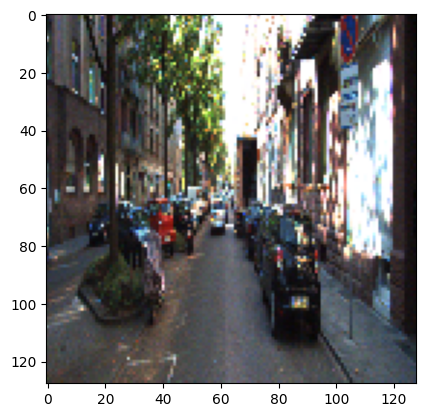

In [9]:
from pyparsing.core import SkipTo
from keras.layers.serialization import activation
def Generator():

  # Put 'None' instead of 256 to have the chance to put images of different sizes
  inputs = tf.keras.layers.Input(shape=[IMG_WIDTH, IMG_HEIGHT, 3])

  down_stack = [
    downsample(64, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128),  # (batch_size, 64, 64, 128)
    downsample(256),  # (batch_size, 32, 32, 256)
    downsample(512),  # (batch_size, 16, 16, 512)
    downsample(512),  # (batch_size, 8, 8, 512)
    downsample(512),  # (batch_size, 4, 4, 512)
    downsample(512),  # (batch_size, 2, 2, 512)
    # downsample(512),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512),  # (batch_size, 16, 16, 1024)
    upsample(256),  # (batch_size, 32, 32, 512)
    upsample(128),  # (batch_size, 64, 64, 256)
    # upsample(64),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  
  # The number of filters is following the number of channels (for rgb images it must be 3). If it is willing to generate gray scale images, put 1. 
  last = Conv2DTranspose(filters = chnl_num,
                         kernel_size = 4,
                         strides = 2,
                         padding = 'same',
                         kernel_initializer = initializer, 
                         activation = 'tanh')

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)
    
  # Invert the layers on the encoder regardless the bottleneck layer to have the possibility to connect all of them with the decoder.
  skips = reversed(skips[:-1])
  
  # Decoder + concatenation of the skip connections. 
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])
  
  x = last(x)
  return tf.keras.Model(inputs=inputs, outputs=x)

# Load an image for testing pourposes
for in_img, tg_img in train_dataset.take(1):
  plt.imshow((in_img[0,...] + 1 ) / 2)
  test_im = (in_img + 1 ) / 2
  print(test_im.shape)
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(2, 128, 128, 3)


<function matplotlib.pyplot.show(close=None, block=None)>

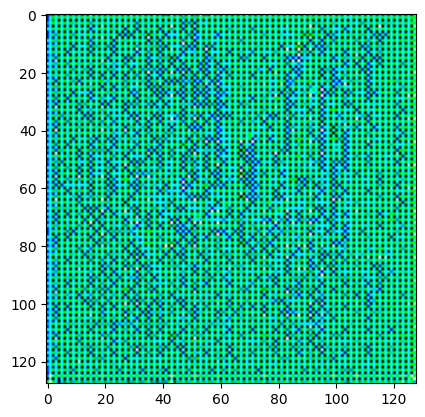

In [10]:
# Creation of the generator for the model
generator = Generator()

# Check an image generated initially by the generator (must be all noise)
gen_output = generator(((test_im+1)*255), training=False)
print(gen_output.shape)
plt.imshow(gen_output[0,...])
plt.show

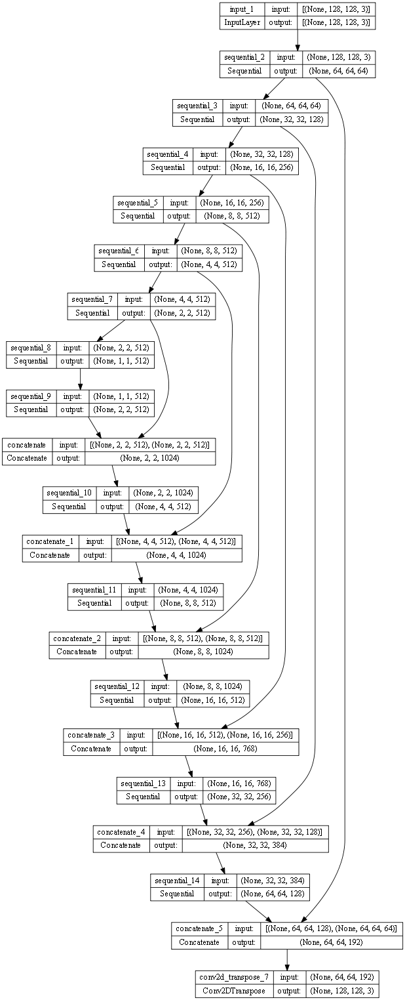

In [11]:
# Show the model architecture for the generator
utils.plot_model(generator, show_shapes=True, dpi=64)

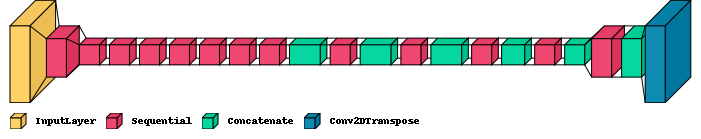

In [12]:
# Show all architecture distributed by layers visually
visualkeras.layered_view(Generator(), legend=True, scale_xy=0.6, scale_z=0.03)

### Discriminator (patchGAN)

The paper does not use a CNN as a typical discriminator (0 or 1), it uses a patchGan. Instead of return a 0 or 1, it returns a matrix of values (patches) where the values correspond to more real or fake values of the target image.

(Basically is like a CNN cutted by the end)

In [13]:
def Discriminator():
  # The discriminator must have access to the real image and the generated one, so 2 insputs must have considered. 
  ini = Input(shape = [IMG_WIDTH, IMG_HEIGHT, 3], name='input_img')
  gen = Input(shape = [IMG_WIDTH, IMG_HEIGHT, chnl_num], name='gener_img')

  # Concatenate both images
  con = concatenate([ini, gen])

  initializer = tf.random_normal_initializer(0., 0.02)

  down1 = downsample(64, apply_batchnorm = True)(con)  # (batch_size, 128, 128, 64)
  #down2 = downsample(128)(down1)  # (batch_size, 64, 64, 128)
  #down3 = downsample(256)(down2)  # (batch_size, 32, 32, 256)
  #down4 = downsample(512)(down3)  # (batch_size, 16, 16, 512)

  # Apply 1 filter at the end to have just 1 channel -> Real value or not for each pixel.
  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down1)
  last = Conv2D(filters = 1,kernel_size = 4,strides = 1, padding = 'same',kernel_initializer = initializer)(zero_pad1)
  
  return tf.keras.Model(inputs = [ini, gen], outputs=last)


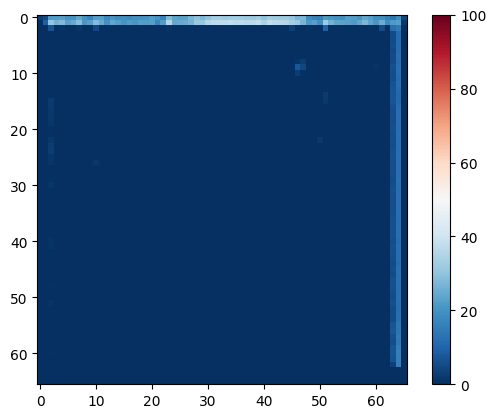

In [14]:
# Creation of the discriminator object
discriminator = Discriminator()

# Check how initially the dicriminator is classifying an image from the generator
disc_out = discriminator([((test_im+1)*255), gen_output], training = False)

# Check the patch results and its size:
plt.imshow(disc_out[0,...,-1], vmin = 0, vmax = 100, cmap = 'RdBu_r')
plt.colorbar()

# To be deleted
shape = disc_out.shape
global patch_size
patch_size = shape[2]

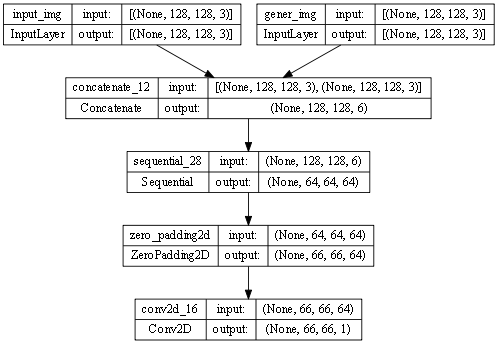

In [15]:
# Check the model architecture for the discriminator
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

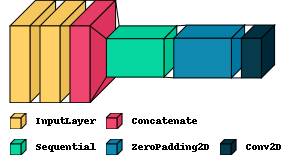

In [16]:
# Check the structure of the discriminator model more visually.
visualkeras.layered_view(Discriminator(), legend=True, scale_xy=0.6, scale_z=0.9)

### Adversial cost function
Basically this will merge the result from the generator and discriminator. And will be the one that makes the comptition between the 2 nets during the training.

In [17]:
#Definition of the cost function with BinaryCrossentropy from keras for calculating the cross entropy of each pixel of the images obtained
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(disc_real_output, disc_generated_output):
  # Difference between the real image and the one generated by the discriminator.
  # On a perfect results scenario it must said that all pixels on the image are real (all hot).
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  # Difference between the discriminator result and the one generated by the generator.
  # On a perfect results scenario for the discriminator all values must be false (cold).
  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  # Compute the total discriminator loss upon all possible sources.
  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [18]:
LAMBDA = 20

def generator_loss(disc_generated_output, gen_output, target):
  # The adversarial error is the result of the discriminator after assessing the input image against the expected result or ground truth (all ones means hot) 
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  #  Differences by pixels in absolut value between the ground truth and the generated image.
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  # LAMBDA hyperparameter allow us to tune the weight of each error on generator loss. Pix2pix paper recommends 100.
  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

# 3) Optimizators + checkpoint generator

Set up all parameters for the optimizers for the discriminator and generator and the checkpoint generators

In [19]:
# Adam optimizator with hyperparameters specified by the original paper -> tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
#Upgrades on https://keras.io/examples/generative/gan_ada/. Here I found some tips to optimize the models
learning_rate_generator = 2e-5
learning_rate_discriminator = 2e-5
beta_1 = 0.5
beta_2 = 0.999

generator_optimizer = tf.keras.optimizers.Adam(learning_rate_generator, beta_1=beta_1, beta_2=beta_2)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate_discriminator, beta_1=beta_1, beta_2=beta_2)

# To save the state of the training process and the optimizers status for both discriminator and generator
checkpoint_prefix = os.path.join(CKPATH, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

# 4) Generate images function
Write a function to plot some images during training.

- Pass images from the test set to the generator.
- The generator will then translate the input image into the output.
- The last step is to plot the predictions and voila!

Note: The `training=True` is intentional here since you want the batch statistics, while running the model on the test dataset. If you use `training=False`, you get the accumulated statistics learned from the training dataset (which you don't want).

In [20]:
def generate_images(model, test_input, tar, name, save_filename = False, display_imgs = True):
  prediction = model(test_input, training=True)

  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  if display_imgs:
    for i in range(3):
      plt.subplot(1, 3, i+1)
      plt.title(title[i])
      # Getting the pixel values in the [0, 1] range to plot.
      if i==2:
        plt.imshow(display_list[i] * 0.5 + 0.5, cmap='gray')
      else:
        plt.imshow(display_list[i] * 0.5 + 0.5)
      plt.axis('off')
  if save_filename:
    plt.savefig(PATH + '/output/' + name + '.jpg', dpi=300)
  plt.show()

In [21]:
def generate_test_images(model, test_input, tar, name, save_filename = False, display_imgs = True):

  prediction = model(test_input, training=True)

  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  if display_imgs:
    for i in range(3):
      plt.subplot(1, 3, i+1)
      plt.title(title[i])
      # Getting the pixel values in the [0, 1] range to plot.
      if i==2:
        plt.imshow(display_list[i] * 0.5 + 0.5, cmap='gray')
      else:
        plt.imshow(display_list[i] * 0.5 + 0.5)
      plt.axis('off')
  if save_filename:
    plt.savefig(PATH + '/Output_test_results/' + name + '.jpg', dpi=300)
  plt.show()

In [22]:
def evaluate(model, test_input, name, save_filename = False, display_imgs = True):
  global patch_size
  test_input= resize(test_input, test_input)
  test_input = test_input[0]
  prediction = model(test_input, training=True)

  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  if display_imgs:
    for i in range(2):
      plt.subplot(1, 2, i+1)
      plt.title(title[i])
      # Getting the pixel values in the [0, 1] range to plot.
      if i==1:
        plt.imshow(display_list[i] * 0.5 + 0.5, cmap='gray')
      else:
        plt.imshow(display_list[i] * 0.5 + 0.5)
      plt.axis('off')
  if save_filename:
    plt.savefig(PATH + '/Output_test_results/' + name + '.jpg', dpi=300)
  plt.show()

  return prediction[0], test_input

# 5) Generate metrics evaluation functions: 

Write a function to plot the following:

- Plot all losses from the generator and the discrimnator
- Plot all accuracies from generator and discriminator

Write also a function to compute frechet inception distance for all images in all epochs.

Create a function to store all metrics data in a json file to review it afterwards.

In [23]:
# Compute the frechet distance for a single batch
def frechet_calculation(real_imgs,gen_imgs):

    # Transform to numpy array to treat the mean, std and cov
    embedding_realimg=real_imgs.numpy().flatten()
    embedding_genimg=gen_imgs.numpy().flatten()
    
    # calculate mean and covariance statistics for each array
    mur, sigmar= embedding_realimg.mean(axis=0), np.cov(embedding_realimg, rowvar=False)
    mug, sigmag = embedding_genimg.mean(axis=0), np.cov(embedding_genimg,  rowvar=False)
    
    # calculate sum squared difference between means
    musdiff = np.sum((mur - mug)**2.0)
    # calculate sqrt of product between cov
    covmean = np.sqrt(sigmar.dot(sigmag))

    # check and correct imaginary numbers from sqrt in case it is complex
    if np.iscomplexobj(covmean):
       covmean = covmean.real

    # calculate the weighted frechet distance from a batch
    frechet_distance_val = musdiff + sigmar+sigmag-2.0*covmean

    return frechet_distance_val

# Function to plot losses and metrics for the system
def plot_losses(generator_losses, discriminator_losses,frechet_dist,generator_acc, discriminator_acc):
    
    PLT_PATH = r"C:\Users\Alejandro\Documents\Universitat\Master MUAR\Q2\Reconeixement de Formes i Aprenentatge Automàtic\Treball final\DepthGAN\Plots"
    
    fig, ((ax1, ax2), (ax3, ax4))=plt.subplots(2,2,figsize=(15,10),tight_layout=True)

    # Plot losses generator
    ax1.plot(generator_losses, label='Generator Loss')
    ax1.set_xlabel('Iteration/Epoch')
    ax1.set_ylabel('Loss')
    ax1.set_title('Generator Losses')
    ax1.grid(True)

    # Plot losses discriminator
    ax2.plot(discriminator_losses, label='Discriminator Loss')
    ax2.set_xlabel('Iteration/Epoch')
    ax2.set_ylabel('Loss')
    ax2.set_title('Discriminator Losses')
    ax2.grid(True)

    # Plot frechet inception distance
    ax3.plot(frechet_dist, label='Frechet distance')
    ax3.set_xlabel('Iteration/Epoch')
    ax3.set_ylabel('Distance')
    ax3.set_title('Fake vs Real images frechet distance')
    ax3.grid(True)

    # Plot accuracies
    ax4.plot(discriminator_acc, label='Accuracy real (DRIA)')
    ax4.plot(generator_acc, label='Accuracy fakes (DFIA)')
    ax4.set_xlabel('Iteration/Epoch')
    ax4.set_ylabel('Accuracy [%]')
    ax4.set_yticks(np.linspace(0,100,11))
    ax4.set_title('Discriminator accuracies')
    ax4.grid(True)
    ax4.legend()

    fig.suptitle('Training results evaluation along all epochs')
    save_path = PLT_PATH + '/model_metrics.png'
    plt.savefig(save_path)
    plt.show()

# Append at the end of each element of a json file the new metrics
def modifmetrics(filename,disc_loss,gen_loss,disc_real_acc,disc_fake_acc,frech_dist):
    
    # Load the file and obtain the data from the metrics
    metricdata=open(filename)
    data_obj=json.load(metricdata)
    
    # Update all values appending the last obtained on the epoch
    L=data_obj["disc_loss"]; L.append(disc_loss); data_obj["disc_loss"]=L
    L=data_obj["gen_loss"]; L.append(gen_loss); data_obj["gen_loss"]=L
    L=data_obj["disc_real_acc"]; L.append(disc_real_acc); data_obj["disc_real_acc"]=L
    L=data_obj["disc_fake_acc"]; L.append(disc_fake_acc); data_obj["disc_fake_acc"]=L
    L=data_obj["frech_dist"]; L.append(frech_dist); data_obj["frech_dist"]=L
    
    # Update data on the json file
    data=open(filename,"w")
    json.dump(data_obj,data,indent=2)
    data.close()
    metricdata.close()

# 6) Train rutine:

- Definition of the function where a training step is performed with each epoch and that is called on each epoch (train_step).
- Definition of the function that holds all the loop for all the steps and that process all data received from each train step (train).

In [24]:
from IPython.display import clear_output
from keras.models import load_model

@tf.function
def train_step(input_image, target):
    # Convert the target to grayscale if chnl_num == 1
    if chnl_num == 1:
        target = tf.image.rgb_to_grayscale(target)

    # Define the objects: Gradient tape of the generator and discriminator
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # Generator generates image
        gen_output = generator(input_image, training=True)

        # Discriminator evaluates the generated image and the real image
        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)
        #Output size: tensor(batch_size, patch_size, patch_size, 1) -> Normalize the values so it it between -1 and 1      
        
        # Compute the generator loss functions
        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        # Compute the discriminator loss function
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

        # Calculate the gradients of the generator/discriminator (Register operations and calculate gradients)
        generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
        discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

        # Optimize the parameters based on the calculated gradients
        generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
        discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

    return gen_total_loss, disc_loss, gen_l1_loss, gen_gan_loss, disc_real_output, disc_generated_output, gen_output

def train(dataset, epochs):
    
    # Create lists to store generator and discriminator loss values, frechet distance and discriminator outputs
    generator_losses = [];l1_losses=[]; gan_losses=[]; discriminator_losses = []
    frechet_distance = []; real_output_disc=[]; fake_output_disc=[]
    
    for epoch in range(epochs):
        
        # Variables for each epoch, all losses, discriminator outputs accuracies and frechet distance
        imgi = 0; epoch_gen_loss = 0.0; epoch_disc_loss = 0.0
        epoch_l1_loss=0.0; epoch_gan_loss=0.0; frech_dist = 0.0
        disc_real_outpt=[]; disc_gen_outpt=[]
        
        # Train the GAN with all dataset
        for input_image, target in dataset:
            
            # Make a training step to get the results from some images
            print('epoch ' + str(epoch) + ' - train: ' + str(imgi) + '/' + str(len(tr_urls)))
            clear_output(wait=True)
            imgi += 1
            gen_total_loss, disc_loss, l1_loss, gan_loss, disc_real_out, disc_gen_out, gen_image= train_step(input_image, target)
            
            # Make post-processing of the Patch received from the GAN network:
            # Normalize all outputs between -1 and 1.
            disc_real=tf.nn.tanh(disc_real_out); disc_gen=tf.nn.tanh(disc_gen_out)
            
            # Check frechet distance and accuracies for all images on the batch individually:
            frechet=0
            for j in range (disc_real.shape[0]):
                # Get the values from discriminator for real and fake images on each batch
                disc_output_real=disc_real[j].numpy(); disc_output_gen=disc_gen[j].numpy()
                disc_real_acc=disc_output_real.mean(); disc_fake_acc=disc_output_gen.mean()
                
                # Get the frechet inception distance for each image on the batch and add it to frechet value
                frechet=frechet+frechet_calculation(target[j],gen_image[j])
                
                # Classify on real or fake upon the mean values of each image
                if (disc_real_acc>=0): disc_real_acc=1
                else: disc_real_acc=0
                if (disc_fake_acc>=0): disc_fake_acc=1
                else: disc_fake_acc=0
                
                #Add the values to the list of all images            
                disc_real_outpt.append(disc_real_acc)
                disc_gen_outpt.append(disc_fake_acc)
            
            # Update the generator and discriminator losses after each batch together with the accuracies and frechet distances
            epoch_gen_loss += gen_total_loss
            epoch_disc_loss += disc_loss
            epoch_l1_loss+=l1_loss
            epoch_gan_loss+=gan_loss
            frech_dist += frechet
              
        # Calculate average losses and frechet distance for the epoch together with its accuracy
        epoch_gen_loss /= imgi
        epoch_disc_loss /= imgi
        epoch_l1_loss /= imgi
        epoch_gan_loss /= imgi
        disc_real_acc_epoch=sum(disc_real_outpt)/len(disc_real_outpt)
        disc_fake_acc_epoch=sum(disc_gen_outpt)/len(disc_real_outpt)
        frech_dist /= imgi

        # Append all values to the final list gathering the result for each epoch
        generator_losses.append(epoch_gen_loss)
        discriminator_losses.append(epoch_disc_loss)
        l1_losses.append(epoch_l1_loss)
        gan_losses.append(epoch_gan_loss)
        real_output_disc.append(disc_real_acc_epoch)
        fake_output_disc.append(disc_fake_acc_epoch)
        frechet_distance.append(frech_dist)
        
        # Print obtained values from the training step after all post - processing for losses and frechet distances
        print(f'Epoch {epoch}/{epochs}')
        print(f'Generator loss: {epoch_gen_loss}')
        print(f'Generator GAN loss: {epoch_gan_loss}')
        print(f'Generator L1 loss: {epoch_l1_loss}')
        print(f'Discriminator loss: {epoch_disc_loss}')
        print(f'Frechet distance: {frech_dist}')
        print(f'Discrimator real images accuracy: {disc_real_acc_epoch}')
        print(f'Discrimator fake images accuracy: {disc_fake_acc_epoch}')
        clear_output(wait=True)
        
        # Add all results from the epochs to the losses and metrics already saved on the json file
        modifmetrics(ROOT_PATH+"/metrics.json",float(epoch_disc_loss.numpy()),float(epoch_gen_loss.numpy()),float(disc_real_acc_epoch*100),float(disc_fake_acc_epoch*100),frech_dist)
            
        # Show results of current epoch with some examples 
        for inp, tar in test_dataset.take(3):
            generate_images(generator, inp, tar, str(imgi) + '_' + str(epoch), save_filename=True, display_imgs=True)
    
        # Save a checkpoint each 20 epochs
        x = 20
        if (epoch + 1) % x == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

# 7) Step to restore a checkpoint before starting a training process

Only uncomment and execute this cell when necessary

In [25]:
#### Code to restore the latest checkpoint from a training process ####
#checkpoint.restore(tf.train.latest_checkpoint(CKPATH))

# 8) Training step:

Based on executing the function train specifying the number of epochs and then collecting all metrics and statistics from it to plot it on a final plot

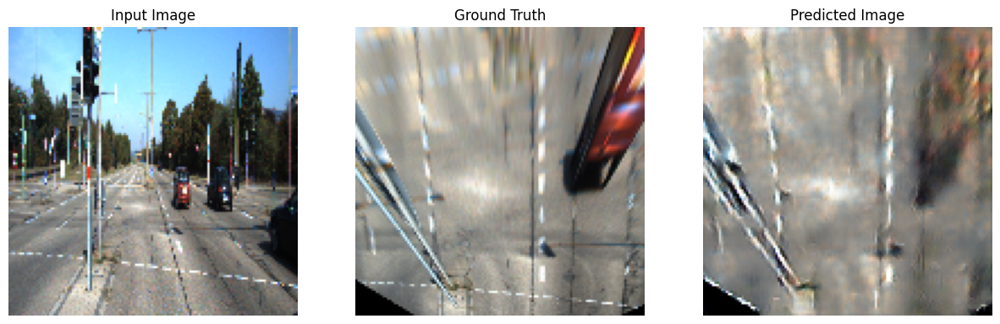

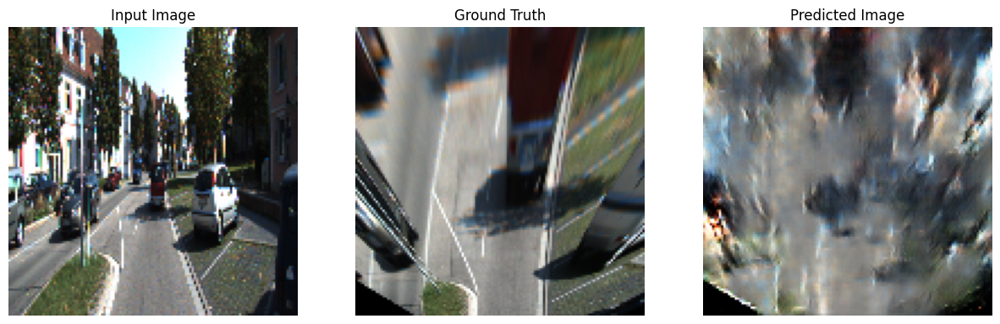

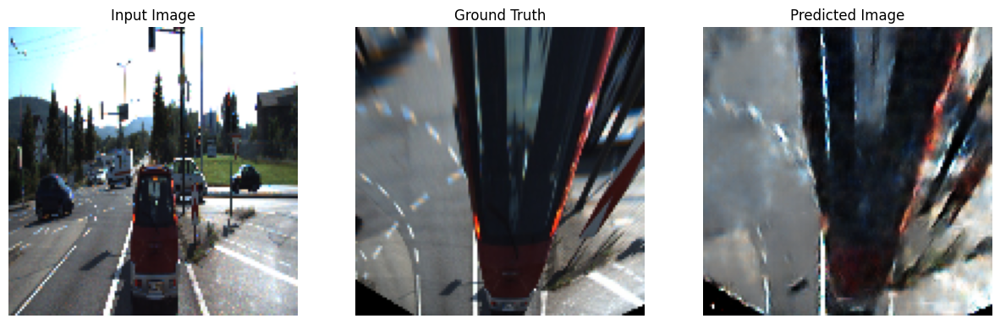

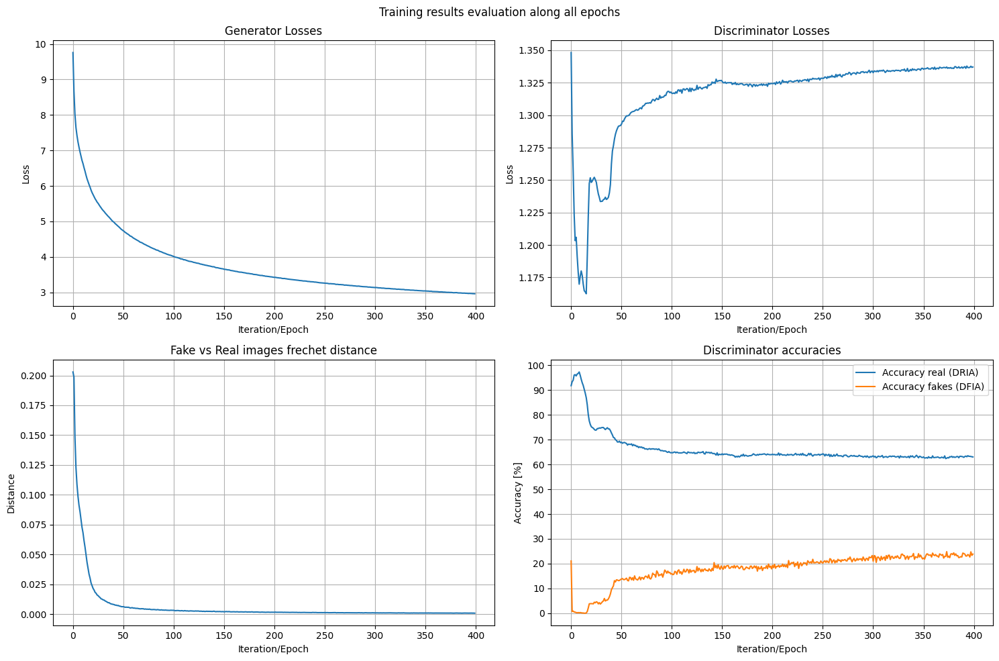

In [26]:
# Specify the number of epochs first to run: 
EPOCHS=400

# Execute the training procedure
train(train_dataset,EPOCHS)

# Upload all data stored on the json file to plot all data from the training process:
metric_data=json.load(open(ROOT_PATH + "/metrics.json","r"))
lossgen=metric_data["gen_loss"]
lossdisc=metric_data["disc_loss"]
frechet_dist=metric_data["frech_dist"]
discracc=metric_data["disc_real_acc"]
discfacc=metric_data["disc_fake_acc"]

# Plot all information from the json file as results:
plot_losses(lossgen,lossdisc,frechet_dist,discfacc, discracc)

# 9) Save/Load Model

Save the latest model generated after all the training

In [27]:
generator.save(PATH + '/models/generator_final.h5')

Load the latest model from the specified path to do all testing procedure

In [28]:
model = load_model(PATH +'/models/generator_final.h5')

# 10) Testing

Some images are used from the testing dataset, generate the output from the generator, save it and plot on the cells to show the results

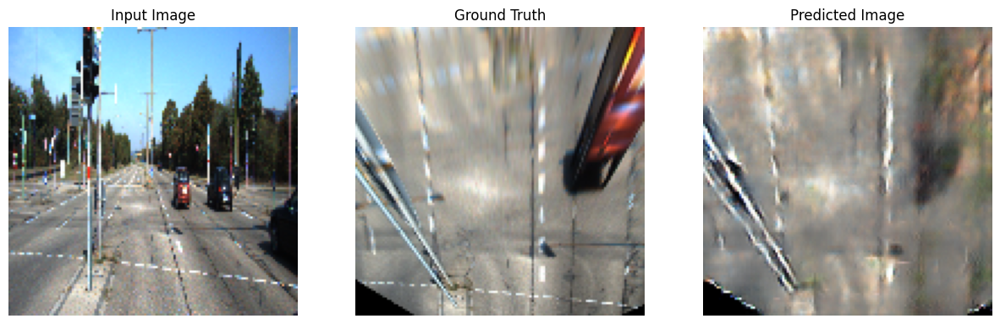

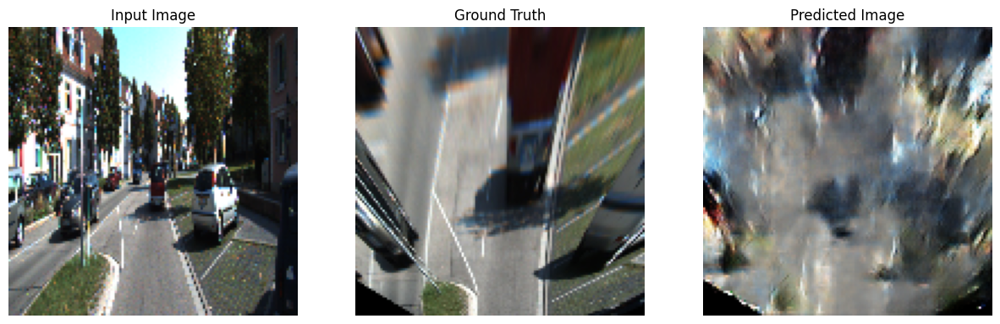

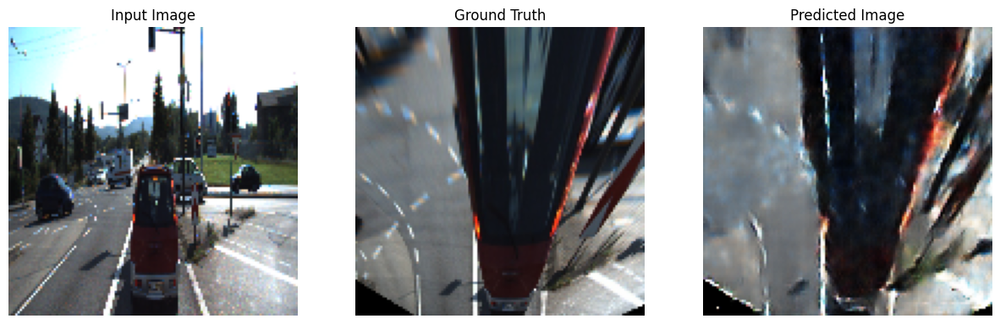

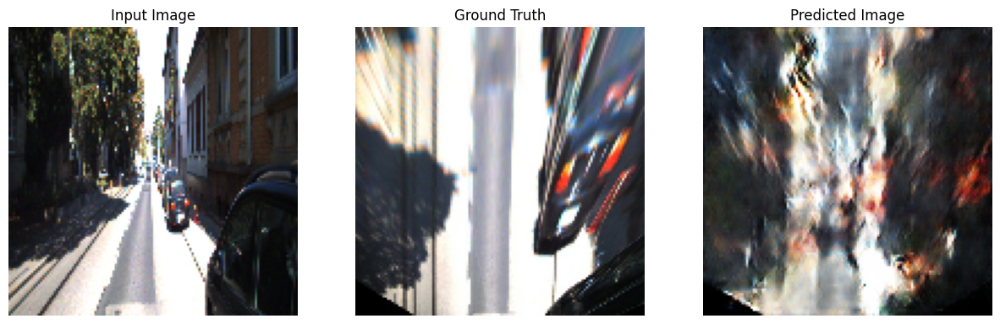

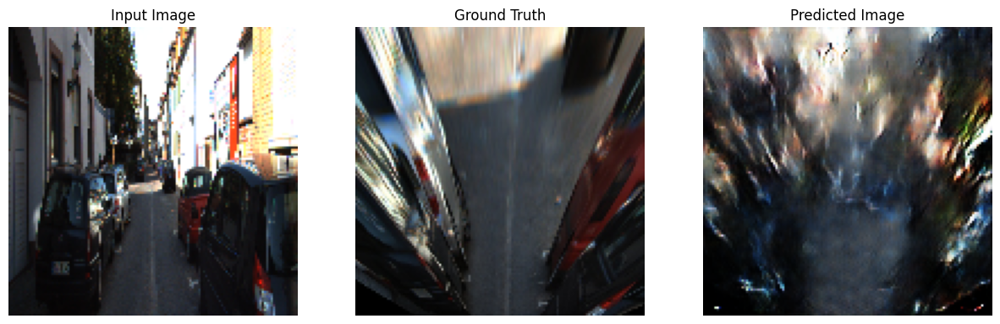

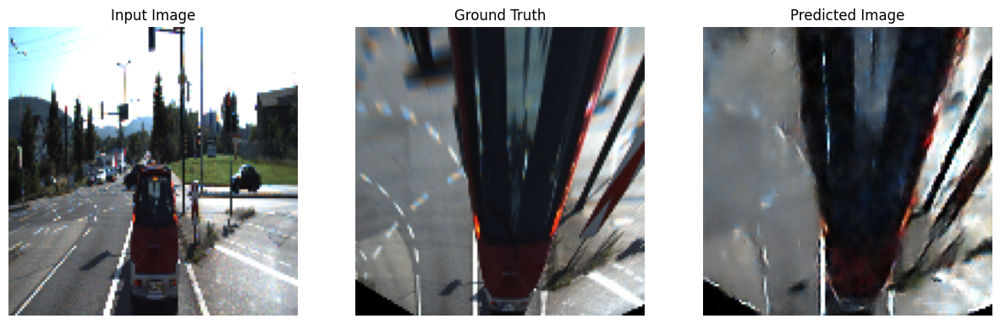

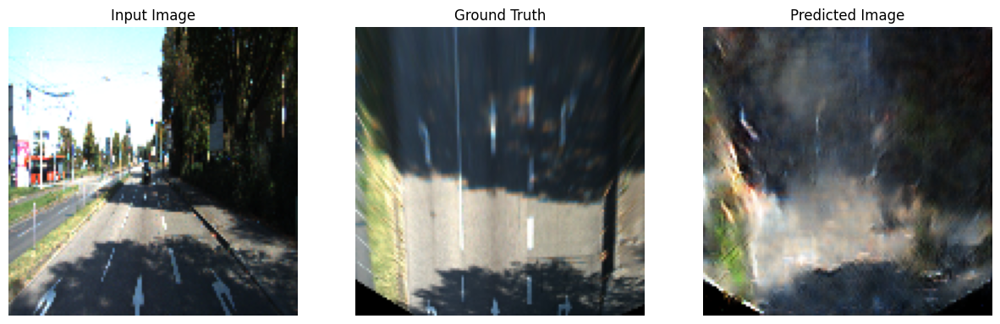

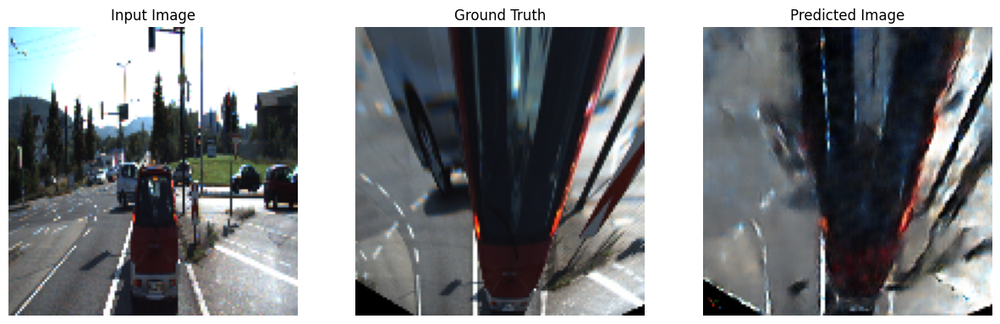

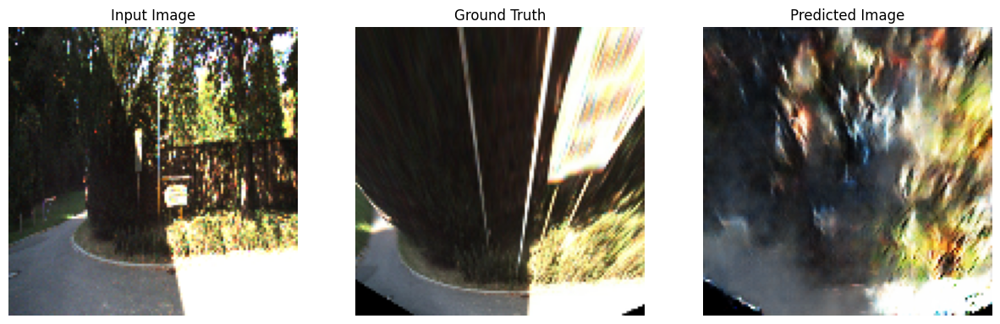

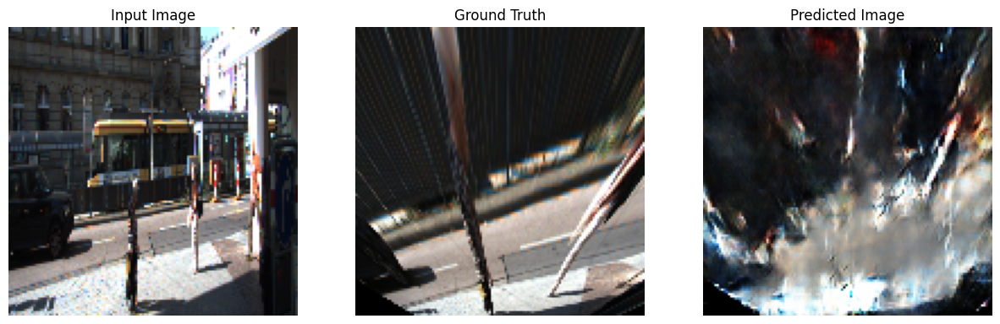

In [29]:
i = 0
for inp, tar in test_dataset.take(10):
    name = 'test_' + str(i)
    generate_test_images(model, inp, tar, name , save_filename = True, display_imgs = True)
    i += 1